# Imports and Parameters

In [ ]:
pip install shap

In [ ]:
pip install lime

In [ ]:
from __future__ import print_function, division

import os
import io
import requests
import random
import time
import numpy as np
import copy
import cv2
import pdb
import shap
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
import itertools

from PIL import Image
from sklearn.metrics import classification_report, confusion_matrix
from skimage.segmentation import mark_boundaries
from torchvision import models, transforms, datasets
from torch.autograd import Variable
from torch.nn import functional as F
from lime import lime_image

plt.ion()   # interactive mode
random.seed(42)

# Load Dataset

In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/1ltgBpehYxkY-zkjXOoh6e3AJHtIcYtrT/view?usp=drive_link

Downloading...
From (original): https://drive.google.com/uc?id=1ltgBpehYxkY-zkjXOoh6e3AJHtIcYtrT
From (redirected): https://drive.google.com/uc?id=1ltgBpehYxkY-zkjXOoh6e3AJHtIcYtrT&confirm=t&uuid=b5a445aa-8343-46f7-932f-e25b59b38bcd
To: /content/hymenoptera_data.zip
100% 47.3M/47.3M [00:02<00:00, 18.6MB/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip hymenoptera_data.zip

Archive:  hymenoptera_data.zip
   creating: hymenoptera_data/
   creating: hymenoptera_data/train/
   creating: hymenoptera_data/train/ants/
  inflating: hymenoptera_data/train/ants/0013035.jpg  
  inflating: hymenoptera_data/train/ants/1030023514_aad5c608f9.jpg  
  inflating: hymenoptera_data/train/ants/1095476100_3906d8afde.jpg  
  inflating: hymenoptera_data/train/ants/1099452230_d1949d3250.jpg  
  inflating: hymenoptera_data/train/ants/116570827_e9c126745d.jpg  
  inflating: hymenoptera_data/train/ants/1225872729_6f0856588f.jpg  
  inflating: hymenoptera_data/train/ants/1262877379_64fcada201.jpg  
  inflating: hymenoptera_data/train/ants/1269756697_0bce92cdab.jpg  
  inflating: hymenoptera_data/train/ants/1286984635_5119e80de1.jpg  
  inflating: hymenoptera_data/train/ants/132478121_2a430adea2.jpg  
  inflating: hymenoptera_data/train/ants/1360291657_dc248c5eea.jpg  
  inflating: hymenoptera_data/train/ants/1368913450_e146e2fb6d.jpg  
  inflating: hymenoptera_data/train/ants/147318

# Preprocess

In [ ]:
# data dir
DATA_DIR = "/content/hymenoptera_data"

# model parameters
MODEL_NAME = "resnext101"
NUM_CLASSES = 2
FIXED_FEATURE_EXTRACTOR = True # True --> Base model weights fixed

# input size of image
INPUT_SIZE = (460, 460)

# data parameters
BATCH_SIZE = 30
SHUFFLE = True
NUM_WORKERS = 0

# optimizer hyperparameters
LEARNING_RATE = 0.001
USE_ADAM_OPTIM = True

# SGD optimizer hyperparameters
MOMENTUM = 0.9

# Adam optimizer hyperparameters
BETA_1 = 0.9
BETA_2 = 0.999
EPSILON = 1e-08
WEIGHT_DECAY = 1e-5 #0.0

# training hyperparameters
NUM_EPOCHS = 25

# lr learning rate scheduler hyperparameters
DECAY_STEP_SIZE = 5
GAMMA = 0.1

# cyclic learning rate scheduler hyperparameters
BASE_LR = 0.001
MAX_LR = 0.005
STEP_SIZE_UP = 2000
STEP_SIZE_DOWN = None
MODE_CYCLIC = "triangular" # "triangular2" or "exp_range"

# ReduceLROnPlateau learning rate scheduler hyperparameters
MODE_PLATEAU = "min" # "max"
FACTOR = 0.1
PATIENCE = 2
COOLDOWN = 0
MIN_LR = 0

# other
RANDOM = 42

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

# Select and Load Model

In [ ]:
def initialize_model(model_name, num_classes, feature_extract, custom_input_size, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these variables is model specific.
    model = None
    input_size = 0
    finalconv_name = ""

    if model_name == "densenet161":
        """ Densenet
        """
        model = models.densenet161(pretrained=use_pretrained)
        set_parameter_requires_grad(model, feature_extract)
        num_ftrs = model.classifier.in_features
        model.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = (224, 224)
        finalconv_name = "features"

    elif model_name == "resnet152":
        """ Resnet152
        """
        model = models.resnet152(pretrained=use_pretrained)
        set_parameter_requires_grad(model, feature_extract)
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, num_classes)
        input_size = (224, 224)
        finalconv_name = "layer4"

    elif model_name == "resnet101":
        """ Resnet101
        """
        model = models.resnet101(pretrained=use_pretrained)
        set_parameter_requires_grad(model, feature_extract)
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, num_classes)
        input_size = (224, 224)
        finalconv_name = "layer4"

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model, feature_extract)
        # Handle the auxilary net
        num_ftrs = model.AuxLogits.fc.in_features
        model.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs,num_classes)
        input_size = (299, 299)
        finalconv_name = "Mixed_7c"

    elif model_name == "resnext50":
        """ ResNext50
        """
        model = models.resnext50_32x4d(pretrained=use_pretrained)
        set_parameter_requires_grad(model, feature_extract)
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, num_classes)
        input_size = (224, 224)
        finalconv_name = "layer4"

    elif model_name == "resnext101":
        """ ResNext101
        """
        model = models.resnext101_32x8d(pretrained=use_pretrained)
        set_parameter_requires_grad(model, feature_extract)
        num_ftrs = model.fc.in_features
        model.fc = nn.Linear(num_ftrs, num_classes)
        input_size = (224, 224)
        finalconv_name = "layer4"

    else:
        print("Invalid model name")
        exit()

    # Gather the parameters to be optimized/updated in this run.
    params_to_update = set_params_to_update(model, feature_extract)

    # Overwrite input size, if custom input size is set in parameters
    if (not INPUT_SIZE[0] is None) and (not INPUT_SIZE[1] is None):
        input_size = custom_input_size

    return model, input_size, params_to_update, finalconv_name

def set_parameter_requires_grad(model, feature_extract):
    if feature_extract:
        for param in model.parameters():
            param.requires_grad = False

def set_params_to_update(model, feature_extract):
    params_to_update = []
    if feature_extract:
        for param in model.parameters():
            if param.requires_grad == True:
                params_to_update.append(param)
    else:
        params_to_update = model.parameters()
    return params_to_update

In [ ]:
# Initialize the model for this run
net, input_size, params_to_update, finalconv_name = initialize_model(MODEL_NAME, NUM_CLASSES, FIXED_FEATURE_EXTRACTOR, INPUT_SIZE)

# Send the model to GPU
net = net.to(device)

# Print the initiated model
print(net)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

# Load Data

In [ ]:
class RandomDiscreteRotation(object):
    def __init__(self, angles):
        self.discrete_angles = angles

    def __call__(self, img):
        angle = random.choice(self.discrete_angles)
        return transforms.functional.rotate(img, angle)

In [ ]:
# define data transformations
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize(input_size),
        transforms.ColorJitter(brightness=0.05, contrast=0.05, saturation=0.05, hue=0.05),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        RandomDiscreteRotation([0, 90, 180, 270]), # TODO --> depending on input size
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    "val": transforms.Compose([
        transforms.Resize(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    "test": transforms.Compose([
        transforms.Resize(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [ ]:
# create datasets
image_datasets = {x: datasets.ImageFolder(os.path.join(DATA_DIR, x), data_transforms[x])
                  for x in ["train", "val"]}
image_datasets

{'train': Dataset ImageFolder
     Number of datapoints: 244
     Root location: /content/hymenoptera_data/train
     StandardTransform
 Transform: Compose(
                Resize(size=(460, 460), interpolation=bilinear, max_size=None, antialias=True)
                ColorJitter(brightness=(0.95, 1.05), contrast=(0.95, 1.05), saturation=(0.95, 1.05), hue=(-0.05, 0.05))
                RandomHorizontalFlip(p=0.5)
                RandomVerticalFlip(p=0.5)
                ToTensor()
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            ),
 'val': Dataset ImageFolder
     Number of datapoints: 153
     Root location: /content/hymenoptera_data/val
     StandardTransform
 Transform: Compose(
                Resize(size=(460, 460), interpolation=bilinear, max_size=None, antialias=True)
                ToTensor()
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
            )}

In [ ]:
# create dataloaders
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=BATCH_SIZE, shuffle=SHUFFLE, num_workers=NUM_WORKERS)
              for x in ["train", "val"]}
dataloaders

{'train': <torch.utils.data.dataloader.DataLoader at 0x79e5e0160d90>,
 'val': <torch.utils.data.dataloader.DataLoader at 0x79e5e0161510>}

In [ ]:
class_names = image_datasets["train"].classes
class_names

['ants', 'bees']

Visualize some images from the training set to understand data augmentations.

In [ ]:
def imshow(images, title=None):
    """Imshow for Tensor."""
    images = images.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    images = std * images + mean
    images = np.clip(images, 0, 1)
    plt.figure(figsize=(16,10))
    plt.imshow(images)
    if title is not None:
        plt.title(title)
    #plt.pause(0.001)  # pause a bit so that plots are updated
    plt.show()

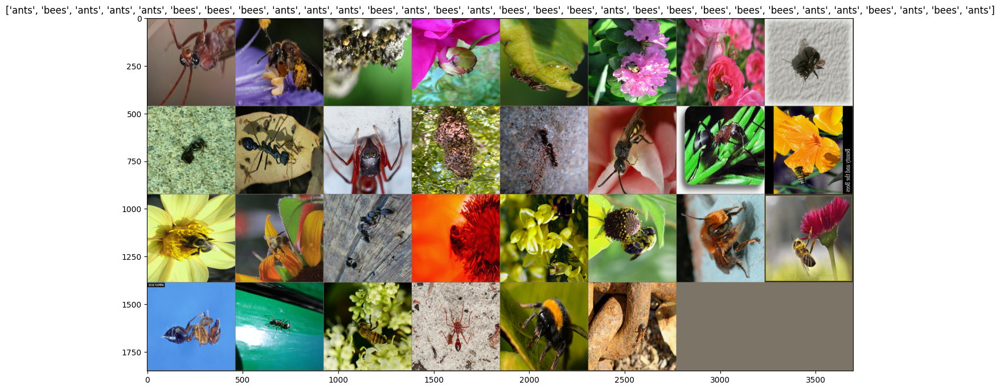

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(dataloaders["train"]))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

# Train Model

In [ ]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_inception=False):
    # start time for tracking training time
    since = time.time()

    # list for tracking
    val_acc_history = []
    val_loss_history = []
    train_acc_history = []
    train_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print("Epoch {}/{}".format(epoch, num_epochs - 1))
        print("-" * 10)

        for phase in ["train", "val"]:
            if phase == "train":
                #scheduler.step()
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == "train"):
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == "train":
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    if phase == "train":
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print("{} Loss: {:.4f} Acc: {:.4f}".format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == "val" and train_acc_history[-1] > 0.9 and epoch_acc >= best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == "train":
                train_acc_history.append(epoch_acc)
                train_loss_history.append(epoch_loss)
            if phase == "val":
                scheduler.step(epoch_loss)
                val_acc_history.append(epoch_acc)
                val_loss_history.append(epoch_loss)

        print()

    time_elapsed = time.time() - since
    print("Training complete in {:.0f}m {:.0f}s".format(time_elapsed // 60, time_elapsed % 60))
    print("Best val Acc: {:4f}".format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history, val_loss_history, train_acc_history, train_loss_history

In [ ]:
# define optimizer
if USE_ADAM_OPTIM:
    optimizer = optim.Adam(params_to_update, lr=LEARNING_RATE, betas=(BETA_1, BETA_2), eps=EPSILON, weight_decay=WEIGHT_DECAY)
else:
    optimizer = optim.SGD(params_to_update, lr=LEARNING_RATE, momentum=MOMENTUM)

# define objective
if NUM_CLASSES <= 2:
    objective = nn.CrossEntropyLoss() #nn.BCELoss()
else:
    objective = nn.CrossEntropyLoss()

# define learning rate scheduler
#lr_scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=DECAY_STEP_SIZE, gamma=GAMMA)
#lr_scheduler = optim.lr_scheduler.CyclicLR(optimizer, base_lr=BASE_LR, max_lr=MAX_LR, step_size_up=STEP_SIZE_UP, step_size_down=STEP_SIZE_DOWN, mode=MODE_CYCLIC)
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode=MODE_PLATEAU, factor=FACTOR, patience=PATIENCE, cooldown=COOLDOWN, min_lr=MIN_LR)

In [ ]:
# train model
net, val_acc_history, val_loss_history, train_acc_history, train_loss_history = train_model(net, dataloaders, objective, optimizer, lr_scheduler, num_epochs=NUM_EPOCHS, is_inception=(MODEL_NAME=="inception"))

Epoch 0/24
----------
train Loss: 0.6260 Acc: 0.5574
val Loss: 0.4526 Acc: 0.8366

Epoch 1/24
----------
train Loss: 0.4585 Acc: 0.7992
val Loss: 0.3200 Acc: 0.9216

Epoch 2/24
----------
train Loss: 0.3526 Acc: 0.8770
val Loss: 0.2909 Acc: 0.9281

Epoch 3/24
----------
train Loss: 0.2717 Acc: 0.9385
val Loss: 0.2283 Acc: 0.9346

Epoch 4/24
----------
train Loss: 0.2384 Acc: 0.9344
val Loss: 0.2060 Acc: 0.9412

Epoch 5/24
----------
train Loss: 0.2393 Acc: 0.9303
val Loss: 0.2378 Acc: 0.9085

Epoch 6/24
----------
train Loss: 0.2324 Acc: 0.9262
val Loss: 0.1806 Acc: 0.9542

Epoch 7/24
----------
train Loss: 0.2141 Acc: 0.9385
val Loss: 0.1797 Acc: 0.9346

Epoch 8/24
----------
train Loss: 0.1796 Acc: 0.9549
val Loss: 0.1562 Acc: 0.9477

Epoch 9/24
----------
train Loss: 0.1717 Acc: 0.9467
val Loss: 0.1489 Acc: 0.9608

Epoch 10/24
----------
train Loss: 0.2061 Acc: 0.9344
val Loss: 0.1510 Acc: 0.9412

Epoch 11/24
----------
train Loss: 0.1806 Acc: 0.9467
val Loss: 0.1449 Acc: 0.9412

Ep

In [ ]:
def plot_loss(train_loss, val_loss):
    # Get num of epochs
    epochs = np.arange(0, len(train_loss)) + 1

    # Plot loss history
    plt.figure(figsize=(10, 10))
    plt.plot(epochs, train_loss, "r--")
    plt.plot(epochs, val_loss, "b-")
    plt.legend(["Training Loss", "Test Loss"])
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.show()

def plot_accuracy(train_accuracy, val_accuracy):
    # Get num of epochs
    epochs = np.arange(0, len(train_accuracy)) + 1

    # Plot loss history
    plt.figure(figsize=(10, 10))
    plt.plot(epochs, train_accuracy, "r--")
    plt.plot(epochs, val_accuracy, "b-")
    plt.legend(["Training Accuracy", "Test Accuracy"])
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.show()

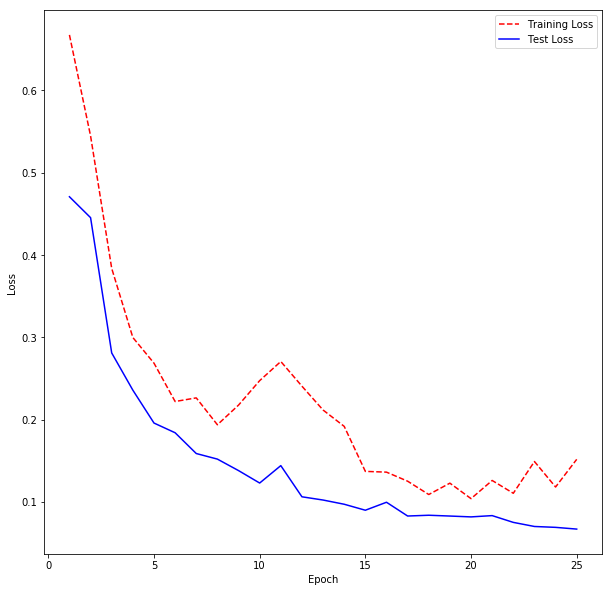

In [ ]:
plot_loss(train_loss_history, val_loss_history)

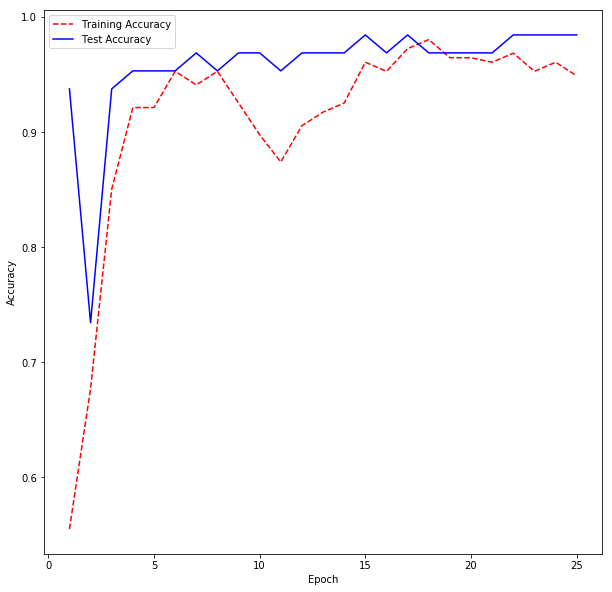

In [ ]:
plot_accuracy(train_acc_history, val_acc_history)

# Evaluate Model on Test Data

In [ ]:
net.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [ ]:
def get_test_results(model, dataloader):
    label = np.array([])
    label_predicted = np.array([])

    for batch_idx, (inputs, labels) in enumerate(dataloader):
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        # append labels
        label = np.append(label, labels.numpy())
        label_predicted = np.append(label_predicted, preds.cpu().numpy())

    return label, label_predicted

In [ ]:
label, label_predicted = get_test_results(net, dataloaders["val"])
len(label), len(label_predicted)

(153, 153)

In [ ]:
label_list = label.tolist()
label_predicted_list = label_predicted.tolist()

# create a classification report
print(classification_report(label_list, label_predicted_list, target_names=class_names))

              precision    recall  f1-score   support

        ants       0.96      0.96      0.96        70
        bees       0.96      0.96      0.96        83

    accuracy                           0.96       153
   macro avg       0.96      0.96      0.96       153
weighted avg       0.96      0.96      0.96       153



Confusion matrix, without normalization
[[67  3]
 [ 3 80]]


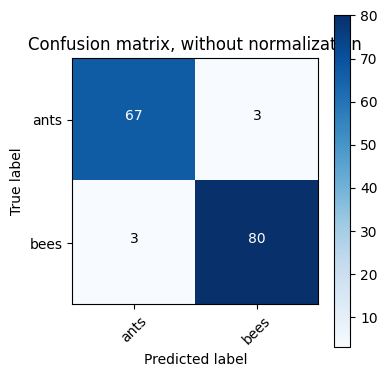

In [ ]:
# create and display a confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Compute confusion matrix
cnf_matrix = confusion_matrix(label_list, label_predicted_list)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure(figsize=(4, 4))
plot_confusion_matrix(cnf_matrix, classes=class_names, title='Confusion matrix, without normalization')
display()

Normalized confusion matrix
[[0.96 0.04]
 [0.04 0.96]]


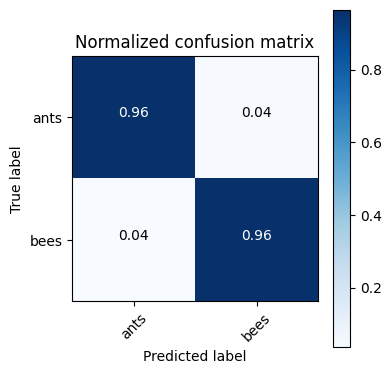

In [ ]:
# Plot normalized confusion matrix
plt.figure(figsize=(4, 4))
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True, title='Normalized confusion matrix')
display()

# Save and Load Model

In [ ]:
# parameters for saving
SAVE_PATH = os.path.join("/content/drive/MyDrive", MODEL_NAME + ".pt")

# save model
torch.save(net.state_dict(), SAVE_PATH)

In [ ]:
MODEL_NAME = "resnext101.pt"
LOAD_PATH = os.path.join("/content/drive/MyDrive", MODEL_NAME)

# load model
# model class must be defined somewhere
net = torch.load(LOAD_PATH)

# 1. Class Activation Mappings (CAM)

Popular networks that are accessible in the `models` subpackage of `torchvision` already implement global average pooling at the end. This means that heatmaps can be generated directly without modifying the network architecture. We only have to register a hook with `torch.nn.register_forward_hook(hook)` at the last convolutional layer of the respective framework. This hook allows us to access the feature maps before the global average pooling operation is applied.

* Compute the weights of the final fully connected layer (prior to softmax activation).
* Multiply each feature map by its corresponding weight for the target class.
* Sum the weighted feature maps to obtain the class activation map (CAM).
Upsample the CAM to the original input image size.

In [ ]:
net = net.cpu()
net.eval()

In [ ]:
features_blobs = [] #store the activations of intermediate layers
def hook_feature(module, input, output):
    features_blobs.append(output.data.cpu().numpy())

def register_hook(model, finalconv_name):
    model._modules.get(finalconv_name).register_forward_hook(hook_feature)
    # get activations of final conv layers

In [ ]:
register_hook(net, finalconv_name)

Now, CAM should be generated for sample images.

In [ ]:
def return_cam(feature_conv, weight_softmax, class_idx, model_input_size):
    # generate the class activation maps upsample to 256x256
    size_upsample = model_input_size
    bz, nc, h, w = feature_conv.shape
    output_cam = []
    for idx in class_idx:
        cam = weight_softmax[idx].dot(feature_conv.reshape((nc, h*w)))
        cam = cam.reshape(h, w)
        cam = cam - np.min(cam)
        cam_img = cam / np.max(cam)
        cam_img = np.uint8(255 * cam_img)
        output_cam.append(cv2.resize(cam_img, size_upsample))
    return output_cam

def calculate_cam(model, model_input_size, features_blobs, img_read_path, classes):
    # get the softmax weight
    params = list(model.cpu().parameters())
    weight_softmax = np.squeeze(params[-2].data.numpy())

    # preprocess image
    preprocess = transforms.Compose([
        transforms.Resize(model_input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    img = Image.open(img_read_path)
    img_tensor = preprocess(img)
    img_variable = Variable(img_tensor.unsqueeze(0))

    # get model prediction
    logit = model(img_variable)
    #print(logit)
    h_x = F.softmax(logit, dim=1).data.squeeze()
    probs, idx = h_x.sort(0, True)
    probs = probs.numpy()
    idx = idx.numpy()

    # output the prediction
    #end = min(NUM_CLASSES, 5)
    #for i in range(0, end):
    #    print('{:.3f} -> {}'.format(probs[i], classes[idx[i]]))

    # generate cAM for the top1 prediction
    CAMs = return_cam(features_blobs[0], weight_softmax, [idx[0]], model_input_size)

    # render the CAM and output
    #print("Output CAM.jpg for the Top-1 Prediction: %s" % classes[idx[0]])
    img = cv2.resize(cv2.imread(img_read_path), model_input_size)
    height, width, _ = img.shape
    heatmap = cv2.applyColorMap(CAMs[0], cv2.COLORMAP_JET) #cv2.resize(CAMs[0],(width, height)), cv2.COLORMAP_JET)
    result = heatmap * 0.3 + img * 0.5
    cv2.imwrite("CAM.jpg", result)
    del features_blobs[:]
    return Image.open("CAM.jpg"), classes[idx[0]]

In [ ]:
def plot_images_cam(paths, model, input_size, features_blobs, class_names, columns=4, rows=5):
    fig = plt.figure(figsize=(15, 15))
    end = min(columns*rows+1, len(paths)+1)
    for i in range(1, end):
        img, pred = calculate_cam(model, input_size, features_blobs, paths[i-1], class_names)
        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text("Predicted: {}".format(pred))
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(img)
    plt.show()

def create_path_list(base_path):
    path_list = []
    files = os.listdir(base_path)
    for _, file in enumerate(files):
        path_list.append(os.path.join(base_path, file))
    return path_list

## 1.1 Single image

In [ ]:
os.listdir(os.path.join(DATA_DIR, "test", "ants"))

['1693954099_46d4c20605.jpg',
 '1743840368_b5ccda82b7.jpg',
 '1804095607_0341701e1c.jpg',
 '1808777855_2a895621d7.jpg',
 '1917341202_d00a7f9af5.jpg',
 '1924473702_daa9aacdbe.jpg',
 '2019439677_2db655d361.jpg',
 '2039585088_c6f47c592e.jpg',
 '2104709400_8831b4fc6f.jpg',
 '2127908701_d49dc83c97.jpg',
 '2191997003_379df31291.jpg',
 '2211974567_ee4606b493.jpg',
 '2219621907_47bc7cc6b0.jpg',
 '2238242353_52c82441df.jpg',
 '2255445811_dabcdf7258.jpg',
 '2265824718_2c96f485da.jpg',
 '2265825502_fff99cfd2d.jpg',
 '2278278459_6b99605e50.jpg',
 '2288450226_a6e96e8fdf.jpg',
 '2288481644_83ff7e4572.jpg',
 '2292213964_ca51ce4bef.jpg',
 'Ant-1818.jpg',
 'Ant_1.jpg',
 'F.pergan.28(f).jpg',
 'Hormiga.jpg',
 'MehdiabadiAnt2_600.jpg',
 'Nepenthes_rafflesiana_ant.jpg',
 'VietnameseAntMimicSpider.jpg',
 'ant photos.jpg',
 'ants-devouring-remains-of-large-dead-insect-on-red-tile-in-Stellenbosch-South-Africa-closeup-1-DHD.jpg',
 'army-ants-red-picture.jpg',
 'desert_ant.jpg',
 'formica.jpeg',
 'hormiga_co_por.jpg',
 'kurokusa.jpg',
 'swiss-army-ant.jpg',
 'termite-vs-ant.jpg',
 'trap-jaw-ant-insect-bg.jpg']

Predicted class: ants


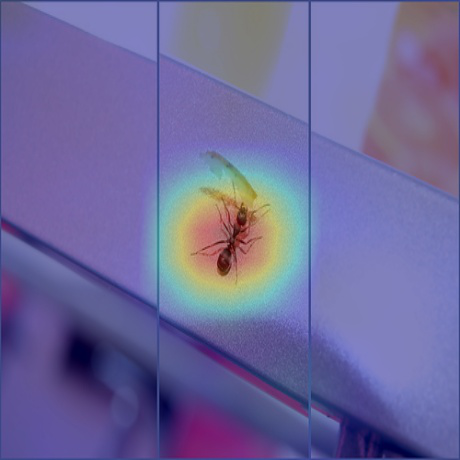

In [ ]:
img_path = os.path.join(DATA_DIR, "test", "ants", "1693954099_46d4c20605.jpg")
img, pred = calculate_cam(net, input_size, features_blobs, img_path, class_names)
print("Predicted class: {}".format(pred))
img

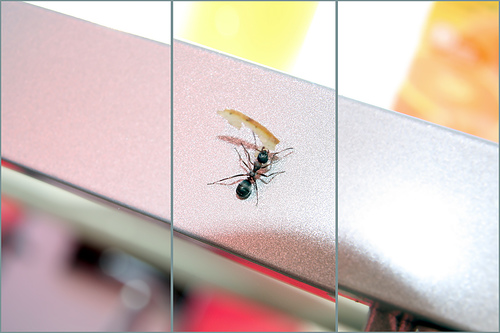

In [ ]:
img = Image.open(img_path)
img

## 1.2 Multiple Images

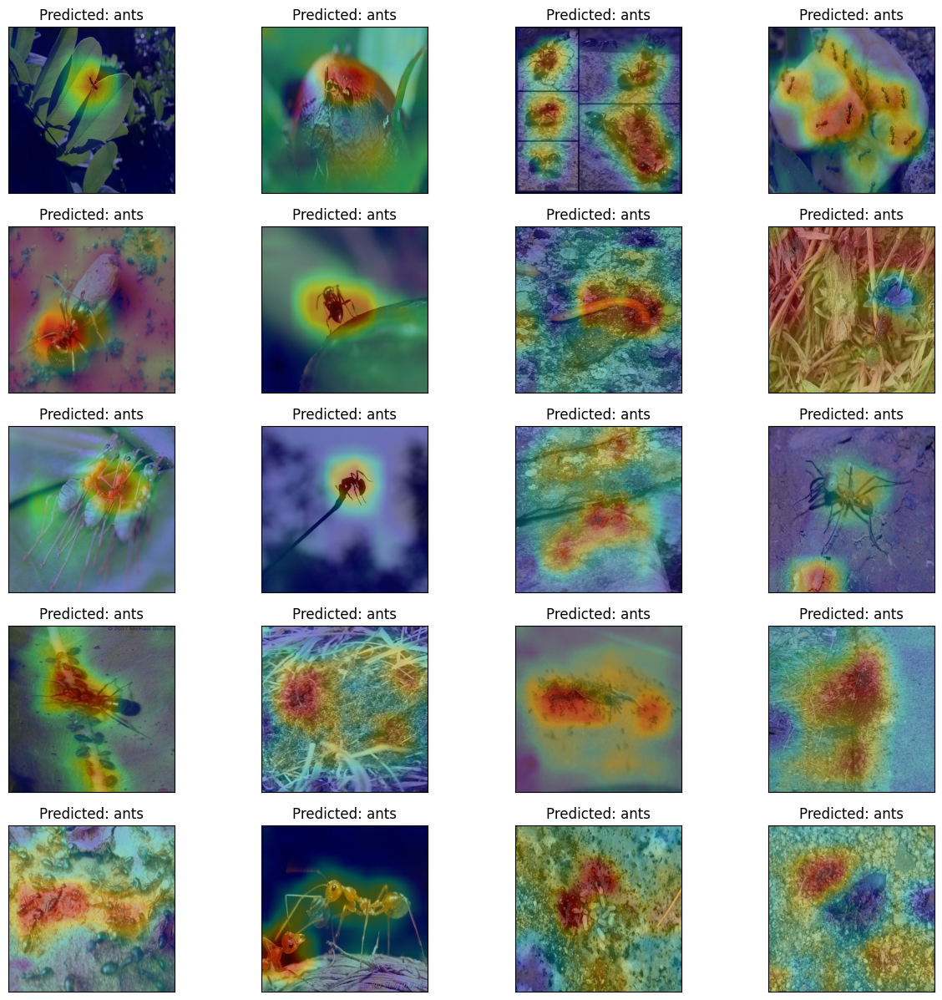

In [ ]:
path_list = create_path_list(os.path.join(DATA_DIR, "val", "ants"))
plot_images_cam(path_list, net, input_size, features_blobs, class_names)

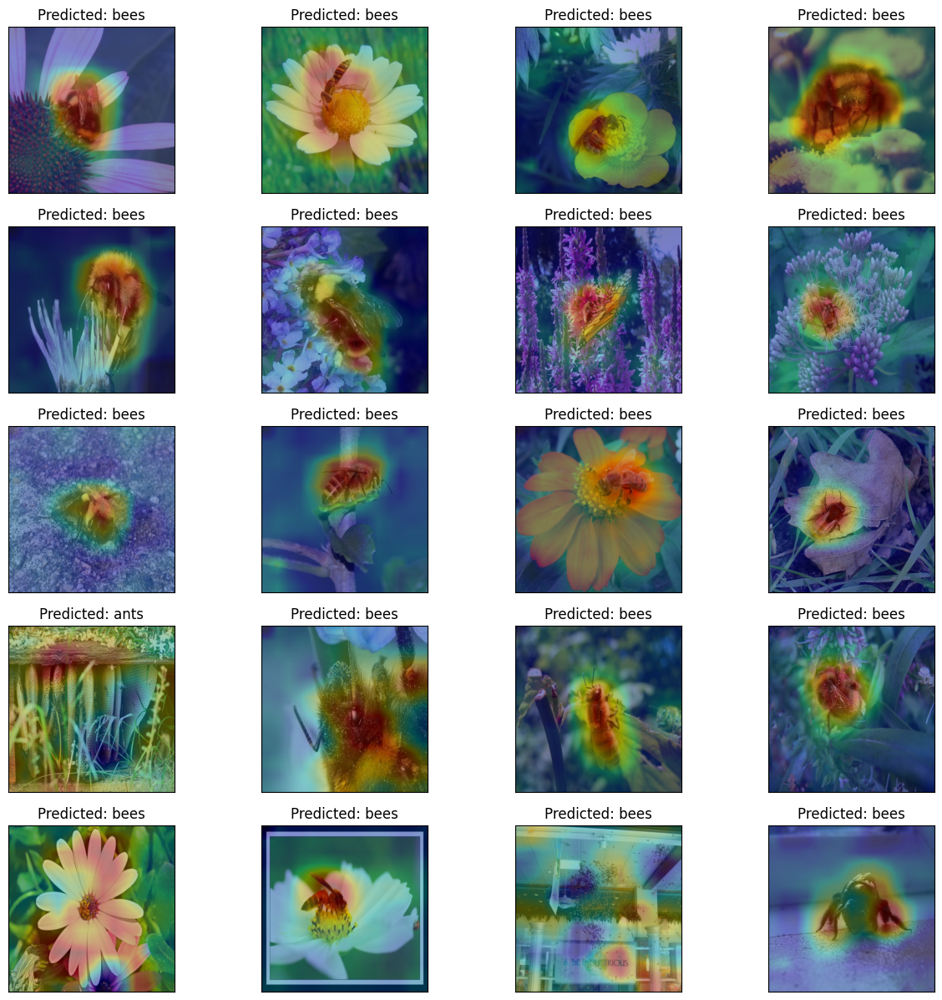

In [ ]:
path_list = create_path_list(os.path.join(DATA_DIR, "val", "bees"))
plot_images_cam(path_list, net, input_size, features_blobs, class_names)

# 2. LIME

In [ ]:
def image_to_tensor_and_normalize(img):
    preprocess = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    return preprocess(img)

def read_image_and_transform(path, model_input_size=input_size, tensor_and_normalize=False):
    img = Image.open(path)
    preprocess = transforms.Compose([
        transforms.Resize(model_input_size)
    ])
    transform = preprocess(img)

    if tensor_and_normalize:
        transform = image_to_tensor_and_normalize(transform)
    return transform

The input of classification function will be a numpy array of images, whereby each image is ndarray of shape (channel, height, width). The output is numpy array of shape (image index, classes) where each value in array should be probability for that image, class combination.

In [ ]:
def batch_predict(imgs, model=net):
    model.eval()
    batch = torch.stack(tuple(image_to_tensor_and_normalize(i) for i in imgs), dim=0)

    model = model.to(device)
    batch = batch.to(device)

    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

In [ ]:
os.listdir(os.path.join(DATA_DIR, "val", "ants"))

['2127908701_d49dc83c97.jpg',
 '11381045_b352a47d8c.jpg',
 '488272201_c5aa281348.jpg',
 '502717153_3e4865621a.jpg',
 '768870506_8f115d3d37.jpg',
 '1337725712_2eb53cd742.jpg',
 '161076144_124db762d6.jpg',
 '751649788_78dd7d16ce.jpg',
 '263615709_cfb28f6b8e.jpg',
 '94999827_36895faade.jpg',
 '2191997003_379df31291.jpg',
 '445356866_6cb3289067.jpg',
 '2104709400_8831b4fc6f.jpg',
 '562589509_7e55469b97.jpg',
 'ants-devouring-remains-of-large-dead-insect-on-red-tile-in-Stellenbosch-South-Africa-closeup-1-DHD.jpg',
 '17081114_79b9a27724.jpg',
 '540543309_ddbb193ee5.jpg',
 '1124525276_816a07c17f.jpg',
 '35558229_1fa4608a7a.jpg',
 '477437164_bc3e6e594a.jpg',
 '2255445811_dabcdf7258.jpg',
 '181942028_961261ef48.jpg',
 '57264437_a19006872f.jpg',
 '1440002809_b268d9a66a.jpg',
 '1247887232_edcb61246c.jpg',
 '147542264_79506478c2.jpg',
 '170652283_ecdaff5d1a.jpg',
 'Hormiga.jpg',
 '205398178_c395c5e460.jpg',
 '172772109_d0a8e15fb0.jpg',
 '1743840368_b5ccda82b7.jpg',
 '1262751255_c56c042b7b.jpg',
 '

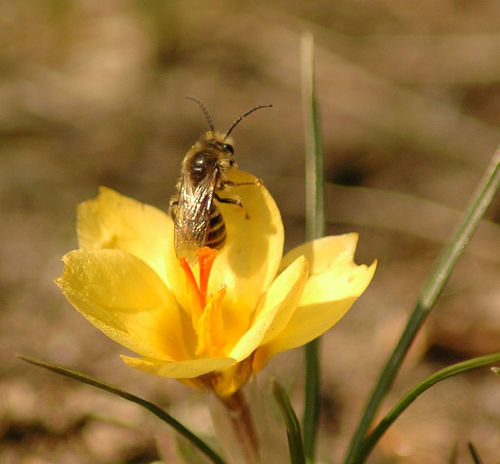

In [ ]:
img_path = os.path.join(DATA_DIR, "val", "bees", "10870992_eebeeb3a12.jpg")
img = Image.open(img_path)
img

test the functions for a single image

In [ ]:
test_pred = batch_predict([read_image_and_transform(img_path, input_size, False)])
idx = test_pred.squeeze().argmax()
print("Predicted class: {}".format(class_names[idx]))

Predicted class: bees


## 2.1 Single Image

use the LIME package for local model explainability

In [ ]:
explainer = lime_image.LimeImageExplainer(random_state=RANDOM)
explanation = explainer.explain_instance(np.array(read_image_and_transform(img_path, input_size, False)),
                                         batch_predict, # classification function
                                         labels=np.array([0]),
                                         #top_labels=1,
                                         num_features=2,
                                         #hide_color=0,
                                         num_samples=1000,
                                         random_seed=RANDOM) # number of images that will be sent to classification function

  0%|          | 0/1000 [00:00<?, ?it/s]

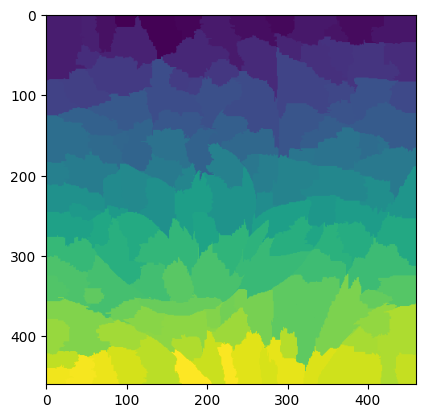

In [ ]:
plt.imshow(explanation.segments)

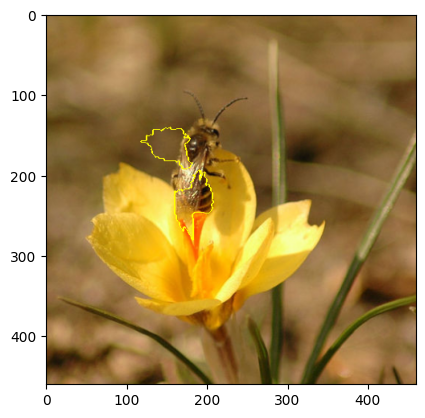

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
img_boundry1 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry1)

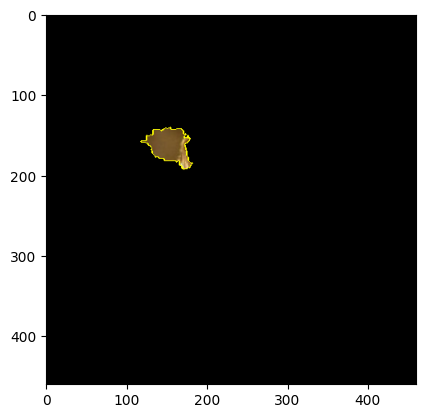

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=1, hide_rest=True)
img_boundry2 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry2)

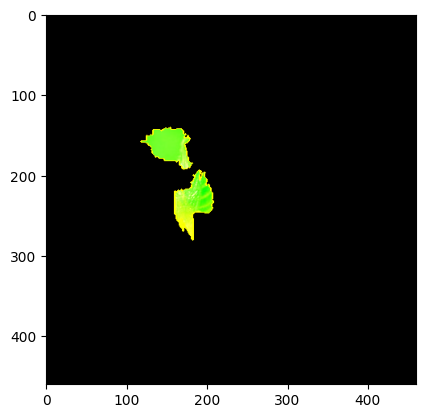

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=True)
img_boundry3 = mark_boundaries(temp/255.0, mask)
plt.imshow(img_boundry3)

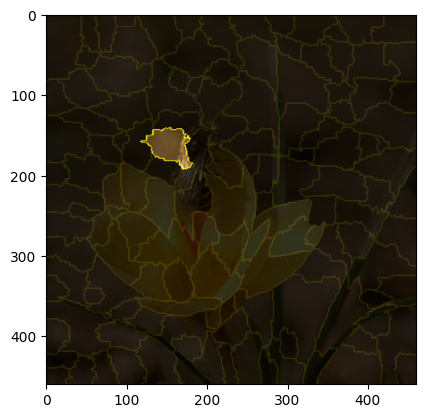

In [ ]:
gigapixels = mark_boundaries(np.zeros((explanation.image.shape)), explanation.segments)
test_img = 0.2 * (explanation.image/255.0) + 0.7 *  img_boundry2 + 0.1 * gigapixels
plt.imshow(test_img)

## 2.2 Multiple Images

In [ ]:
def calculate_lime(img_path, input_size, label_to_explain, num_features=3, num_samples=1000):
    explainer = lime_image.LimeImageExplainer()
    return explainer.explain_instance(np.array(read_image_and_transform(img_path, input_size, False)),
                                      batch_predict,
                                      labels=np.array([label_to_explain]),
                                      #top_labels=1,
                                      num_features=num_features,
                                      hide_color=0,
                                      num_samples=num_samples,
                                      random_seed=RANDOM)

def plot_images_lime(paths, input_size, class_names, label_to_explain, num_features=3, num_samples=1000, columns=4, rows=5):
    fig = plt.figure(figsize=(15, 15))
    end = min(columns*rows + 1, len(paths)+1)
    for i in range(1, end):
        explanation = calculate_lime(paths[i-1], input_size, label_to_explain, num_features, num_samples)
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=num_features, hide_rest=True)
        gigapixels = mark_boundaries(np.zeros((explanation.image.shape)), explanation.segments)
        img_boundry = mark_boundaries(temp/255.0, mask)
        img = 0.4 * (explanation.image/255.0) + 0.5 * img_boundry + 0.1 * gigapixels
        pred_class = class_names[explanation.top_labels[0]]
        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text("Predicted: {}".format(pred_class))
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(img)
    plt.show()

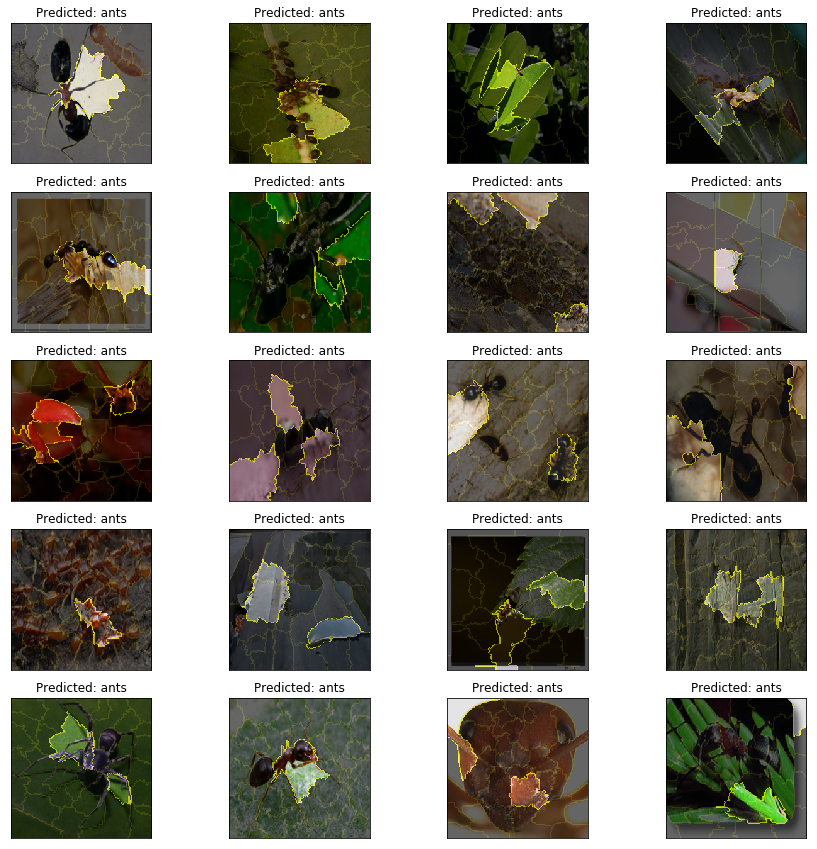

In [ ]:
path_list = create_path_list(os.path.join("hymenoptera_data", "test", "ants"))
plot_images_lime(path_list, input_size, class_names, 0)

# 3. SHAP

In [ ]:
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

In [ ]:
import torch

images, labels = next(iter(dataloaders["val"]))

end = images.shape[0]

background = images[0:end-2]
test_images = images[end-2:end]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net.to(device)
images = images.to(device)
background = background.to(device)

# Clone the tensors before applying relu
background = background.clone().detach().requires_grad_(True)
test_images = test_images.clone().detach().requires_grad_(True)

torch.cuda.empty_cache()
e = shap.DeepExplainer(net, background)
shap_values = e.shap_values(test_images)

In [ ]:
shap_numpy = [np.swapaxes(np.swapaxes(s, 1, -1), 1, 2) for s in shap_values]
val_numpy = np.array([inv_normalize(val_images[i]).numpy().transpose((1, 2, 0))
                       for i in range(val_images.shape[0])])

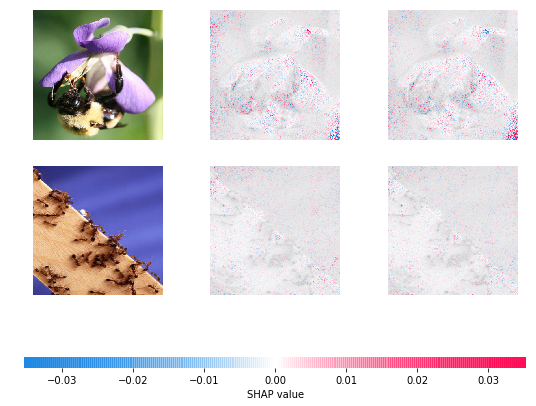

In [ ]:
# plot the feature attributions
shap.image_plot(shap_numpy, val_numpy)

# 4. CounterFactual Explanation

In [ ]:
# Initialize LIME explainer
explainer = lime_image.LimeImageExplainer()

# Select an image from the validation set for which you want to generate counterfactual explanation
image, _ = next(iter(dataloaders["val"]))
image = image[0].unsqueeze(0)  # Select the first image from the batch
image = image.to(device)

# Define the predict function to be used by LIME
def predict_fn(images):
    net.eval()
    images_tensor = torch.tensor(images, dtype=torch.float).to(device)
    images_tensor = images_tensor.permute(0, 3, 1, 2)  # Transpose to channels first format
    images_resized = torch.nn.functional.interpolate(images_tensor, size=(460, 460))  # Resize images to model input size
    outputs = net(images_resized)
    return outputs.detach().cpu().numpy()


# Generate counterfactual explanation
explanation = explainer.explain_instance(image[0].permute(1, 2, 0).cpu().numpy(), predict_fn, top_labels=1, hide_color=0, num_samples=1000)


  0%|          | 0/1000 [00:00<?, ?it/s]

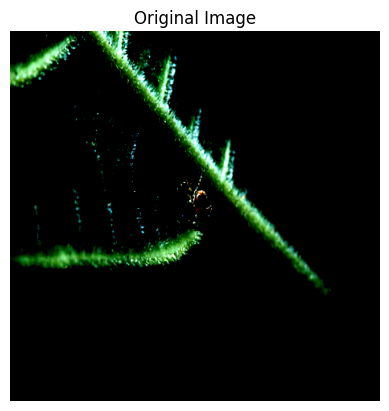

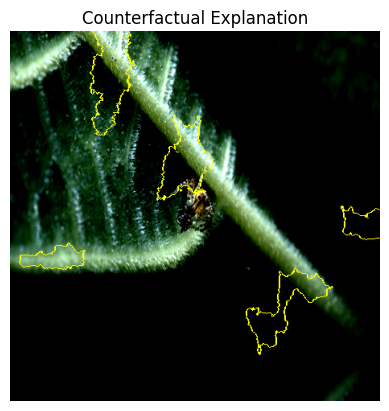

In [ ]:
# Show the original image
plt.imshow(image.squeeze().permute(1, 2, 0).cpu().numpy())
plt.axis('off')
plt.title('Original Image')
plt.show()

# Show the explanation
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.axis('off')
plt.title('Counterfactual Explanation')
plt.show()

In [ ]:
image, _ = next(iter(dataloaders["val"]))
image = image[29].unsqueeze(0)
image = image.to(device)

In [ ]:
explanation = explainer.explain_instance(image[0].permute(1, 2, 0).cpu().numpy(), predict_fn, top_labels=1, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

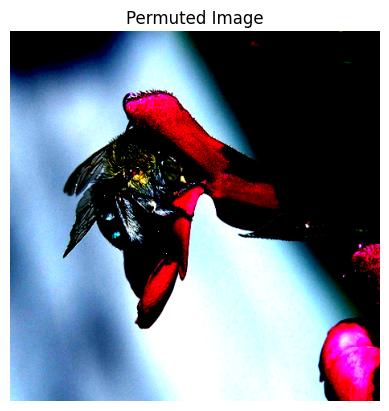

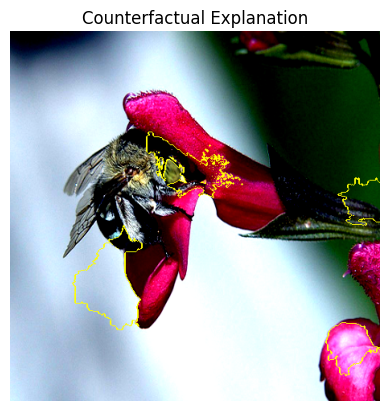

In [ ]:
plt.imshow(image.squeeze().permute(1, 2, 0).cpu().numpy())
plt.axis('off')
plt.title('Perturbated Image')
plt.show()

# Show the explanation
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
plt.axis('off')
plt.title('Counterfactual Explanation')
plt.show()